In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px

In [2]:
import os
from pathlib import Path
from dotenv import load_dotenv

In [3]:
# import Chicagos data
san_fran = pd.read_csv(r'../Project1/Data/Police_Department_Incident_Reports__2018_to_Present.csv')

# Filter and sort data
san_fran = san_fran.rename(columns={"Incident Category": "Incident_Category"})
san_fran = san_fran.rename(columns={"Incident Year": "Year"})
san_fran = san_fran.loc[(san_fran['Year'] >= 2018) & (san_fran['Year'] < 2022)] 
san_fran.head()

,Incident Datetime,Incident Date,Incident Time,Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Longitude,Point,Neighborhoods,ESNCAG - Boundary File,Central Market/Tenderloin Boundary Polygon - Updated,Civic Center Harm Reduction Project Boundary,HSOC Zones as of 2018-06-05,Invest In Neighborhoods (IIN) Areas,Current Supervisor Districts,Current Police Districts
0,2019/03/05 09:00:00 PM,2019/03/05,21:00,2019,Tuesday,2019/03/07 12:54:00 PM,77808706372,778087,196048512,NaN,...,-122.413487,POINT (-122.41348740024354 37.77999173926721),21.0,NaN,1.0,1.0,1.0,NaN,10.0,5.0
1,2018/12/22 12:00:00 PM,2018/12/22,12:00,2018,Saturday,2018/12/26 02:29:00 PM,75246907023,752469,180971777,183601903.0,...,-122.427819,POINT (-122.42781910073226 37.77578657487239),22.0,NaN,NaN,NaN,NaN,NaN,11.0,4.0
2,2018/08/24 05:30:00 PM,2018/08/24,17:30,2018,Friday,2018/08/24 07:35:00 PM,70675306243,706753,180639339,182363732.0,...,-122.422830,POINT (-122.42283006837721 37.72394419349765),90.0,NaN,NaN,NaN,NaN,NaN,2.0,9.0
3,2018/10/20 03:10:00 PM,2018/10/20,15:10,2018,Saturday,2018/10/20 03:10:00 PM,72826462071,728264,180624631,182933454.0,...,-122.403636,POINT (-122.40363551943442 37.7751608100771),32.0,NaN,NaN,NaN,NaN,NaN,10.0,1.0
4,2019/06/05 12:36:00 AM,2019/06/05,00:36,2019,Wednesday,2019/06/05 12:37:00 AM,80823030140,808230,190403077,191560061.0,...,-122.413623,POINT (-122.4136227157606 37.80275505740129),106.0,NaN,NaN,NaN,NaN,NaN,3.0,6.0


In [4]:
# Prove data set has from 2018 - 2021 data 
san_fran.Year.unique()

array([2019, 2018, 2020, 2021], dtype=int64)

In [5]:
san_fran_crime = san_fran[['Year','Incident_Category']]
san_fran.head()

,Incident Datetime,Incident Date,Incident Time,Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Longitude,Point,Neighborhoods,ESNCAG - Boundary File,Central Market/Tenderloin Boundary Polygon - Updated,Civic Center Harm Reduction Project Boundary,HSOC Zones as of 2018-06-05,Invest In Neighborhoods (IIN) Areas,Current Supervisor Districts,Current Police Districts
0,2019/03/05 09:00:00 PM,2019/03/05,21:00,2019,Tuesday,2019/03/07 12:54:00 PM,77808706372,778087,196048512,NaN,...,-122.413487,POINT (-122.41348740024354 37.77999173926721),21.0,NaN,1.0,1.0,1.0,NaN,10.0,5.0
1,2018/12/22 12:00:00 PM,2018/12/22,12:00,2018,Saturday,2018/12/26 02:29:00 PM,75246907023,752469,180971777,183601903.0,...,-122.427819,POINT (-122.42781910073226 37.77578657487239),22.0,NaN,NaN,NaN,NaN,NaN,11.0,4.0
2,2018/08/24 05:30:00 PM,2018/08/24,17:30,2018,Friday,2018/08/24 07:35:00 PM,70675306243,706753,180639339,182363732.0,...,-122.422830,POINT (-122.42283006837721 37.72394419349765),90.0,NaN,NaN,NaN,NaN,NaN,2.0,9.0
3,2018/10/20 03:10:00 PM,2018/10/20,15:10,2018,Saturday,2018/10/20 03:10:00 PM,72826462071,728264,180624631,182933454.0,...,-122.403636,POINT (-122.40363551943442 37.7751608100771),32.0,NaN,NaN,NaN,NaN,NaN,10.0,1.0
4,2019/06/05 12:36:00 AM,2019/06/05,00:36,2019,Wednesday,2019/06/05 12:37:00 AM,80823030140,808230,190403077,191560061.0,...,-122.413623,POINT (-122.4136227157606 37.80275505740129),106.0,NaN,NaN,NaN,NaN,NaN,3.0,6.0


In [6]:
san_fran_crime.Year.unique()

array([2019, 2018, 2020, 2021], dtype=int64)

In [7]:
san_fran_top_ten = san_fran_crime['Incident_Category'].value_counts().head(10).reset_index()
san_fran_top_ten = san_fran_top_ten.rename(columns={"Incident_Category": "Crime_Count","index": "Crime"})
san_fran_top_ten.tail(10)

,Crime,Crime_Count
0,Larceny Theft,165475
1,Other Miscellaneous,39545
2,Malicious Mischief,36627
3,Non-Criminal,33264
4,Assault,32694
5,Burglary,31022
6,Motor Vehicle Theft,26181
7,Recovered Vehicle,20143
8,Warrant,16954
9,Fraud,16308


In [8]:
san_fran_crimelist = san_fran_top_ten['Crime'].tolist()
san_fran_boolean_series = san_fran_crime.Incident_Category.isin(san_fran_crimelist)
top_10_san_fran_df = san_fran_crime[san_fran_boolean_series]
top_10_san_fran_df.sort_index().head(10)

,Year,Incident_Category
0,2019,Larceny Theft
1,2018,Motor Vehicle Theft
2,2018,Larceny Theft
3,2018,Warrant
5,2019,Larceny Theft
6,2018,Other Miscellaneous
7,2018,Burglary
11,2019,Fraud
12,2018,Malicious Mischief
13,2019,Assault


In [9]:
top_10_san_fran_df.Year.unique()

array([2019, 2018, 2021, 2020], dtype=int64)

In [10]:
san_fran_top_10_df  = top_10_san_fran_df.pivot_table(index="Year",
columns="Incident_Category",
aggfunc=len,
fill_value=0)

In [11]:
san_fran_top_10_df

Incident_Category,Assault,Burglary,Fraud,Larceny Theft,Malicious Mischief,Motor Vehicle Theft,Non-Criminal,Other Miscellaneous,Recovered Vehicle,Warrant
Year,,,,,,,,,,
2018,9057,7109,4758,48853,8871,5298,9628,11740,4344,5581
2019,8896,6045,4667,48927,9037,5400,9138,10642,4258,5431
2020,6993,9203,3647,30569,8757,7548,6842,8457,5652,3234
2021,7748,8665,3236,37126,9962,7935,7656,8706,5889,2708


<AxesSubplot:title={'center':'Top Ten Crime Count'}, xlabel='Year'>

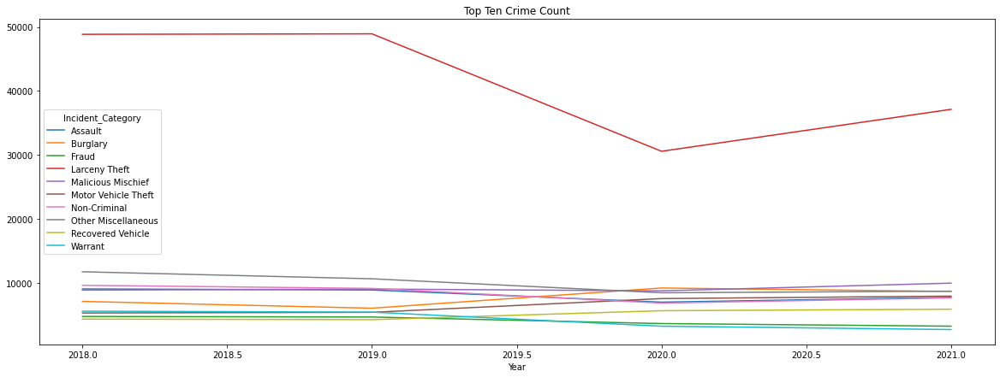

In [12]:
san_fran_top_10_df.plot.line(figsize=(20,7),title='Top Ten Crime Count')

In [13]:
# Plot of the percent change
san_fran_top10_pct_change = san_fran_top_10_df.pct_change()

In [14]:
# Syntax of iloc df.iloc[row_start:row_end , col_start, col_end]
san_fran_top10_pct_change = san_fran_top10_pct_change.iloc[1: , :]
san_fran_top10_pct_change

Incident_Category,Assault,Burglary,Fraud,Larceny Theft,Malicious Mischief,Motor Vehicle Theft,Non-Criminal,Other Miscellaneous,Recovered Vehicle,Warrant
Year,,,,,,,,,,
2019,-0.017776,-0.149669,-0.019126,0.001515,0.018713,0.019253,-0.050893,-0.093526,-0.019797,-0.026877
2020,-0.213916,0.522415,-0.218556,-0.375212,-0.030984,0.397778,-0.251258,-0.205319,0.327384,-0.404530
2021,0.107965,-0.058459,-0.112695,0.214498,0.137604,0.051272,0.118971,0.029443,0.041932,-0.162647


<AxesSubplot:title={'center':'Percent Change in Top Ten Crimes'}, xlabel='Year'>

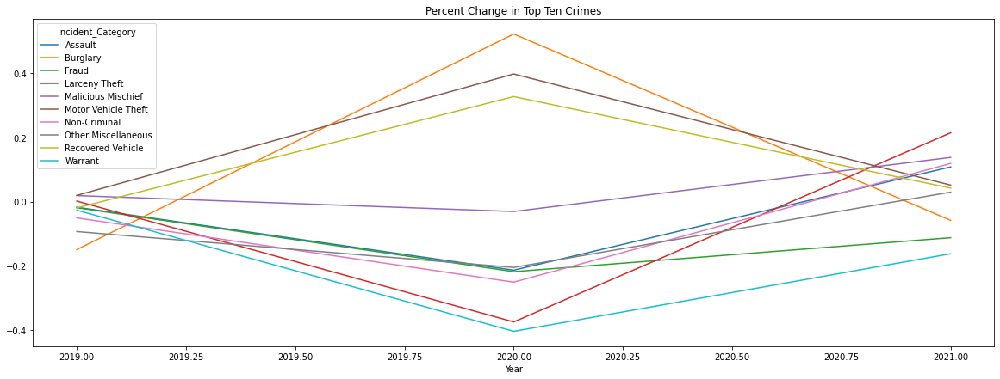

In [15]:
san_fran_top10_pct_change.plot.line(figsize=(20,7),title='Percent Change in Top Ten Crimes')

### What happened 2019 - 2020
# Burglary had the greatest percentage change out of all the crimes
# Larceny Theft fell from 2019 to 2020 but increased by 20% by 2021
# Warrants for arre

In [16]:
# Calculate the correlation between each column
correlation = san_fran_top10_pct_change.corr()
correlation

Incident_Category,Assault,Burglary,Fraud,Larceny Theft,Malicious Mischief,Motor Vehicle Theft,Non-Criminal,Other Miscellaneous,Recovered Vehicle,Warrant
Incident_Category,,,,,,,,,,
Assault,1.000000,-0.866117,0.632497,0.999444,0.936500,-0.889597,0.996953,0.988305,-0.844366,0.724307
Burglary,-0.866117,1.000000,-0.934975,-0.882303,-0.635841,0.998796,-0.824491,-0.779766,0.999118,-0.971964
Fraud,0.632497,-0.934975,1.000000,0.657973,0.320720,-0.916446,0.570155,0.506986,-0.949044,0.992166
Larceny Theft,0.999444,-0.882303,0.657973,1.000000,0.924287,-0.904332,0.993798,0.982670,-0.861762,0.746895
Malicious Mischief,0.936500,-0.635841,0.320720,0.924287,1.000000,-0.672942,0.960999,0.979021,-0.602874,0.436537
Motor Vehicle Theft,-0.889597,0.998796,-0.916446,-0.904332,-0.672942,1.000000,-0.851261,-0.809543,0.995855,-0.959258
Non-Criminal,0.996953,-0.824491,0.570155,0.993798,0.960999,-0.851261,1.000000,0.997188,-0.800004,0.668321
Other Miscellaneous,0.988305,-0.779766,0.506986,0.982670,0.979021,-0.809543,0.997188,1.000000,-0.752791,0.610697
Recovered Vehicle,-0.844366,0.999118,-0.949044,-0.861762,-0.602874,0.995855,-0.800004,-0.752791,1.000000,-0.980979


<AxesSubplot:xlabel='Incident_Category', ylabel='Incident_Category'>

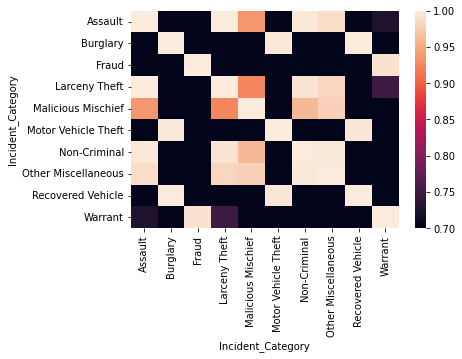

In [17]:
# Use the `heatmap` function from the Seaborn library to visualize correlations
sns.heatmap(correlation, vmin=0.70, vmax=1)

### Some inferences that can be made about the correlation that is filtered above
* Malicious Mischief and Larceny Theft are highly correlated with Assault 



In [18]:
# Filter for thefts
df_theft = san_fran[(san_fran["Incident_Category"]=="Larceny Theft") | (san_fran["Incident_Category"]=="Burglary")]
df_theft = df_theft.sort_values(by=['Year'], ascending=True)
df_theft.head()

,Incident Datetime,Incident Date,Incident Time,Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Longitude,Point,Neighborhoods,ESNCAG - Boundary File,Central Market/Tenderloin Boundary Polygon - Updated,Civic Center Harm Reduction Project Boundary,HSOC Zones as of 2018-06-05,Invest In Neighborhoods (IIN) Areas,Current Supervisor Districts,Current Police Districts
269670,2018/07/05 06:54:00 PM,2018/07/05,18:54,2018,Thursday,2018/08/05 07:01:00 PM,69938906363,699389,180585124,182172845.0,...,-122.403205,POINT (-122.40320508205973 37.773051100635065),NaN,NaN,NaN,NaN,NaN,NaN,10.0,1.0
311141,2018/07/31 07:56:00 AM,2018/07/31,07:56,2018,Tuesday,2018/08/01 08:18:00 AM,70164806224,701648,186183479,NaN,...,-122.423825,POINT (-122.42382522763067 37.78107768298222),100.0,NaN,NaN,1.0,1.0,NaN,11.0,4.0
311148,2018/05/21 04:46:00 AM,2018/05/21,04:46,2018,Monday,2018/05/21 05:00:00 AM,67062406133,670624,180377523,181410373.0,...,-122.405346,POINT (-122.40534607993492 37.786747617678444),19.0,NaN,NaN,NaN,NaN,NaN,3.0,6.0
311149,2018/05/08 06:25:00 PM,2018/05/08,18:25,2018,Tuesday,2018/05/08 10:05:00 PM,66615406244,666154,180343740,181284168.0,...,-122.387917,POINT (-122.3879168122909 37.764379370659356),34.0,NaN,NaN,NaN,NaN,NaN,10.0,2.0
311150,2018/07/05 03:00:00 PM,2018/07/05,15:00,2018,Thursday,2018/07/20 01:17:00 PM,69659906372,696599,186170551,NaN,...,-122.407294,POINT (-122.40729368158074 37.777179297336886),32.0,NaN,NaN,1.0,1.0,NaN,10.0,1.0


In [19]:
boolean_series = df_theft['Incident Subcategory'].isin(['Larceny - Auto Parts','Larceny Theft - Bicycle','Larceny Theft - From Building','Larceny Theft - Other', 'Burglary - Residential'])
san_fran_porch_pirates_df = df_theft[boolean_series]
san_fran_porch_pirates_df.sort_index().head(10)

,Incident Datetime,Incident Date,Incident Time,Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Longitude,Point,Neighborhoods,ESNCAG - Boundary File,Central Market/Tenderloin Boundary Polygon - Updated,Civic Center Harm Reduction Project Boundary,HSOC Zones as of 2018-06-05,Invest In Neighborhoods (IIN) Areas,Current Supervisor Districts,Current Police Districts
0,2019/03/05 09:00:00 PM,2019/03/05,21:00,2019,Tuesday,2019/03/07 12:54:00 PM,77808706372,778087,196048512,NaN,...,-122.413487,POINT (-122.41348740024354 37.77999173926721),21.0,NaN,1.0,1.0,1.0,NaN,10.0,5.0
5,2019/02/12 07:00:00 AM,2019/02/12,07:00,2019,Tuesday,2019/02/12 09:20:00 AM,76962406304,769624,190106328,190430997.0,...,-122.401043,POINT (-122.40104304688674 37.787889612676835),NaN,NaN,NaN,NaN,NaN,NaN,10.0,6.0
22,2019/04/06 11:30:00 PM,2019/04/06,23:30,2019,Saturday,2019/04/07 01:55:00 PM,78913106154,789131,196071002,NaN,...,-122.419206,POINT (-122.41920604493745 37.7602353540718),53.0,NaN,NaN,NaN,3.0,NaN,2.0,3.0
23,2018/12/16 04:45:00 PM,2018/12/16,16:45,2018,Sunday,2018/12/16 05:44:00 PM,74867406301,748674,180946764,183502525.0,...,-122.458732,POINT (-122.45873162377274 37.77933315786935),5.0,NaN,NaN,NaN,NaN,NaN,4.0,8.0
26,2018/10/09 11:00:00 AM,2018/10/09,11:00,2018,Tuesday,2018/10/16 11:15:00 AM,72769906372,727699,186240336,NaN,...,-122.462792,POINT (-122.46279190105041 37.759735782954465),109.0,NaN,NaN,NaN,NaN,NaN,8.0,7.0
47,2019/05/08 04:30:00 PM,2019/05/08,16:30,2019,Wednesday,2019/05/10 05:00:00 PM,80002406374,800024,196091793,NaN,...,-122.402402,POINT (-122.40240244493764 37.79655456585492),106.0,NaN,NaN,NaN,NaN,NaN,3.0,6.0
50,2018/10/27 11:40:00 AM,2018/10/27,11:40,2018,Saturday,2018/10/27 10:02:00 PM,73191206374,731912,186250385,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
58,2018/09/20 08:45:00 PM,2018/09/20,20:45,2018,Thursday,2018/09/20 09:27:00 PM,71682806304,716828,180715020,182634166.0,...,-122.433904,POINT (-122.43390358046642 37.7609547379289),38.0,NaN,NaN,NaN,5.0,NaN,5.0,3.0
62,2018/10/03 12:45:00 AM,2018/10/03,00:45,2018,Wednesday,2018/10/03 12:22:00 PM,72145206126,721452,180748714,182761811.0,...,-122.406226,POINT (-122.4062264387631 37.79755880935262),106.0,NaN,NaN,NaN,NaN,NaN,3.0,6.0
68,2018/08/16 01:30:00 PM,2018/08/16,13:30,2018,Thursday,2018/08/16 04:55:00 PM,71236406374,712364,186204611,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
# Read the Mapbox API key
load_dotenv()
map_box_api = os.getenv("access_token")

# Set the Mapbox API
px.set_mapbox_access_token(map_box_api)

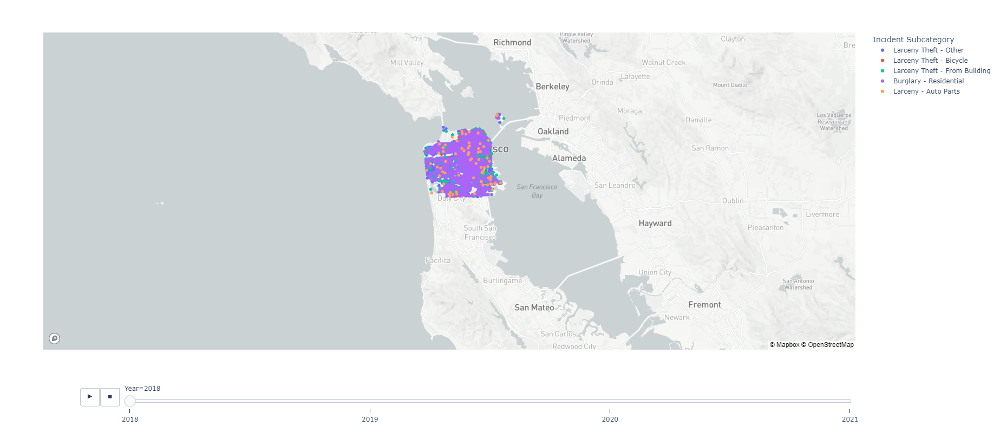

In [21]:
san_fran_map_porch_pirates = px.scatter_mapbox(
    san_fran_porch_pirates_df,
    lat="Latitude",
    lon="Longitude",
    color="Incident Subcategory",
    animation_frame="Year",
    height = 800,
    width = 900,
    zoom=9
)
san_fran_map_porch_pirates.show()

In [28]:
crime_count_df = san_fran_porch_pirates_df
crime_count_df = crime_count_df.groupby(['Year', 'Incident Subcategory'])['Incident Datetime'].count().reset_index(name='Count')
crime_count_df.head(10)

,Year,Incident Subcategory,Count
0,2018,Burglary - Residential,2385
1,2018,Larceny - Auto Parts,76
2,2018,Larceny Theft - Bicycle,618
3,2018,Larceny Theft - From Building,3050
4,2018,Larceny Theft - Other,11759
5,2019,Burglary - Residential,2083
6,2019,Larceny - Auto Parts,188
7,2019,Larceny Theft - Bicycle,530
8,2019,Larceny Theft - From Building,2789
9,2019,Larceny Theft - Other,11843


## Findings:

### Residential burglary has been increasing, about 45% increase from 2019 to 2020. More packages were delievered between those years, which could be the reason for the increase in residential burglaries.
### Theft from buildings have steadily been decreasing over the years. It took a drastic decrease from 2019 to 2020. Assuming offices were not open and less packages got sent to the buildings.


In [45]:
# import san fran population csv
san_fran_pop = pd.read_csv(r'../Project1/Data/San_fran_population.csv')

#rename column names
san_fran_pop = san_fran_pop.rename(columns={"Population": "Population"})
san_fran_pop = san_fran_pop.rename(columns={"Year": "Year"})


#filter 2015 - 2021
san_fran_pop = san_fran_pop.loc[(san_fran_pop['Year'] >= 2015) & (san_fran_pop['Year'] < 2021)] 

san_fran_pop.head()



,Year,Population
5,2015,863836
6,2016,872795
7,2017,879166
8,2018,883305
9,2019,881549


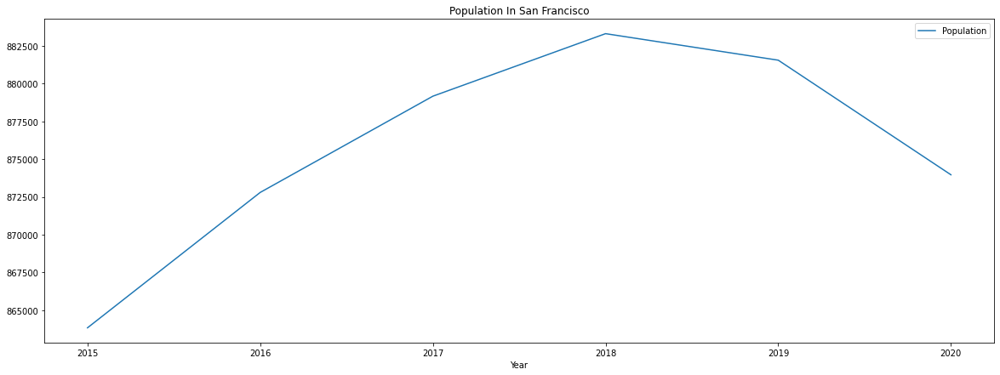

In [47]:
#create line graph for population
san_fran_pop.plot.line(figsize=(20,7), x='Year', title='Population In San Francisco');

In [39]:
import hvplot.pandas
crime_count_df.hvplot.area('Year', 'Count', by='Incident Subcategory', stacked=True, rot=90, hover_cols=['Filter'])

:NdOverlay   [Incident Subcategory]
   :Area   [Year]   (Count,Baseline)

In [ ]:
#packages stole by population

